# Lista 1 de ADR

In [ ]:
] add JuMP HiGHS Plots Distributions Statistics

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
   Installed CodecBzip2 ───────── v0.8.5
   Installed HiGHS_jll ────────── v1.10.0+0
   Installed StructTypes ──────── v1.11.0
   Installed JSON3 ────────────── v1.14.1
   Installed BenchmarkTools ───── v1.6.0
   Installed MutableArithmetics ─ v1.6.4
   Installed MathOptInterface ─── v1.38.0
   Installed JuMP ─────────────── v1.25.0
   Installed HiGHS ────────────── v1.15.0
    Updating `~/.julia/environments/v1.10/Project.toml`
  [31c24e10] + Distributions v0.25.118
  [87dc4568] + HiGHS v1.15.0
  [4076af6c] + JuMP v1.25.0
  [10745b16] + Statistics v1.10.0
    Updating `~/.julia/environments/v1.10/Manifest.toml`
  [6e4b80f9] + BenchmarkTools v1.6.0
  [523fee87] + CodecBzip2 v0.8.5
  [87dc4568] + HiGHS v1.15.0
  [0f8b85d8] + JSON3 v1.14.1
  [4076af6c] + JuMP v1.25.0
  [b8f27783] + MathOptInterface v1.38.0
  [d8a4904e] + MutableArithmetics v1.6.4
  [856f2bd8] + StructTypes v1.11.0
  [8fd58aa0] + 

In [ ]:
using JuMP, HiGHS, Plots, Random, Distributions, Statistics

#Questão 4

In [ ]:
T_c = 3
T_u = 40
r = 0.05
π_0 = 3
Q_bar = 200
I = 15.00
c_0 = 1.00
Q_0 = 100

function c(Q::Int64)::Float64
  return 0.01*(Q^2)
end

function VP(Q::Int64)::Float64
  investimento_inicial = sum((-I * Q)/((1 + r) ^ t) for t = 0:(T_c-1))
  receita_liquida = sum((π_0 * Q)/((1+r) ^ t) - (c(Q)/((1 + r)^t)) for t = 3:(T_c + T_u-1))
  return investimento_inicial + receita_liquida
end

function VP(Q::Int64, T::Int64)::Float64
    investimento_inicial = 0
    receita_liquida = 0
    if T <= T_c
      investimento_inicial = sum((-I * Q)/((1 + r) ^ t) for t = 0:T-1)
    else
      investimento_inicial = sum((-I * Q)/((1 + r) ^ t) for t = 0:T_c-1)
      receita_liquida = sum((π_0 * Q)/((1+r) ^ t) - (c(Q)/((1 + r)^t)) for t = 3:T - 1)
    end
  return investimento_inicial + receita_liquida
end

function PaybackDecontado(Q::Int64, T::Int64)::Tuple{Int64,Float64}
  for i in 1:T
    investimento_inicial = 0
    receita_liquida = 0
    if i <= T_c
      investimento_inicial = sum((-I * Q)/((1 + r) ^ t) for t = 0:i-1)
    else
      investimento_inicial = sum((-I * Q)/((1 + r) ^ t) for t = 0:T_c-1)
      receita_liquida = sum((π_0 * Q - c(Q))/((1 + r)^t) for t = 3:i - 1)
    end

    vp = investimento_inicial + receita_liquida
    if vp > 0
      return i, vp
    end
  end
  return 0,0.0
end

PaybackDecontado (generic function with 1 method)

##a)

In [ ]:
println("Para um Q = 200, temos um VP de $(VP(200))")

Para um Q = 200, temos um VP de -5465.471863220964


##b)

In [ ]:
all_VP = [VP(i) for i in 0:200]
max_value = -Inf
max_index = -1
for i in 1:200
  if all_VP[i] > max_value
    max_value = all_VP[i]
    max_index = i
  end
end
max_value = round(max_value, digits=2)
println("O maior valor presente se dá quando Q = $(max_index) com um VP = $(max_value)")

O maior valor presente se dá quando Q = 13 com um VP = 23.19


##c)

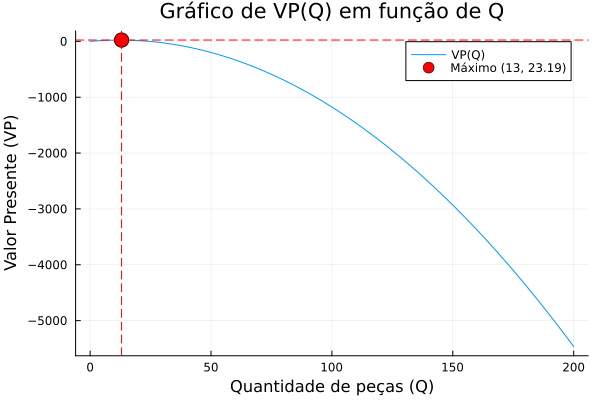

In [ ]:
plot(0:200, all_VP, xlabel="Quantidade de peças (Q)", ylabel="Valor Presente (VP)", label="VP(Q)", title="Gráfico de VP(Q) em função de Q")
scatter!([max_index], [max_value], label="Máximo ($max_index, $max_value)",
         markersize=8, markercolor=:red)
vline!([max_index], linestyle=:dash, linecolor=:red, label="")
hline!([max_value], linestyle=:dash, linecolor=:red, label="")

##d)

O payback descontado se dá em t = 39



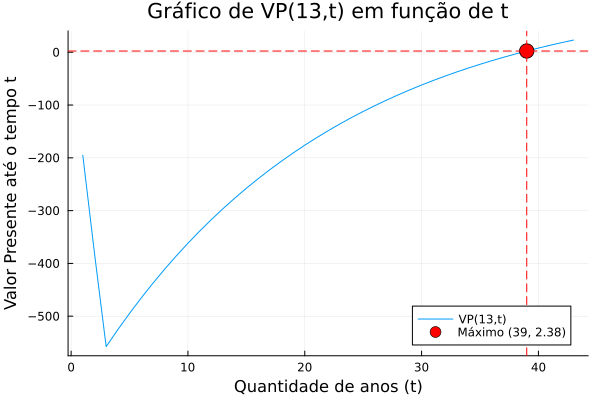

In [ ]:
payback_descontado, vp = PaybackDecontado(max_index,T_c+T_u)
vp = round(vp, digits=2)
println("O payback descontado se dá em t = $(payback_descontado)\n")
vp_t = [VP(max_index, t) for t in 1:T_c+T_u]
plot(1:T_c+T_u, vp_t, xlabel="Quantidade de anos (t)", ylabel="Valor Presente até o tempo t", label="VP(13,t)", title="Gráfico de VP(13,t) em função de t")
scatter!([payback_descontado], [vp], label="Máximo ($payback_descontado, $vp)",
         markersize=8, markercolor=:red)
vline!([payback_descontado], linestyle=:dash, linecolor=:red, label="")
hline!([vp], linestyle=:dash, linecolor=:red, label="")

##e)

Nesse caso podemos observar que não existe payback para Q=200, isso porque não existe um retorno positivo para essa quantidade de peças

In [ ]:
pb_naive, vp = PaybackDecontado(200,T_c+T_u)
println("Para um Q = 200, temos um Payback de $(pb_naive)")

Para um Q = 200, temos um Payback de 0


##f)

In [ ]:
π_0 = 3.0             # Preço inicial
α = 0.5               # Constante do modelo
β = 0.7               # Coeficiente autoregressivo
μ_ε = -1.2            # Média do erro
σ_ε = 1.0             # Desvio padrão do erro
n_cenarios = 5000
T = 42                # Anos (0 a 42)

42

In [ ]:
function simular_preco()
    π = zeros(T+1)
    π[1] = π_0
    for t in 2:(T+1)
        ε = rand(LogNormal(μ_ε, σ_ε))
        π[t] = α + β * π[t-1] + ε
    end
    return π
end

simular_preco (generic function with 1 method)

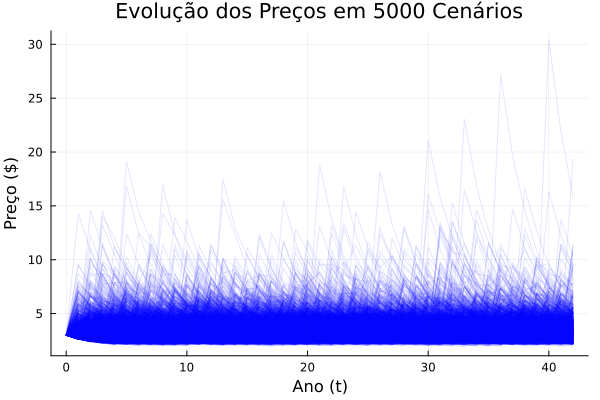

In [ ]:
Random.seed!(13)
precos = [simular_preco() for i in 1:n_cenarios]

plot(0:T, first(precos), label="Cenário 1", color=:blue, alpha=0.1)
for i in 2:n_cenarios
    plot!(0:T, precos[i], label=nothing, color=:blue, alpha=0.1)
end
plot!(title="Evolução dos Preços em 5000 Cenários",
      xlabel="Ano (t)", ylabel="Preço (\$)", legend=false)

##g)

In [ ]:
function VP(Q::Int64, π::Vector{Float64})::Float64
  investimento_inicial = sum((-I * Q)/((1 + r) ^ t) for t = 0:(T_c-1))
  receita_liquida = sum((π[t] * Q)/((1+r) ^ t) - (c(Q)/((1 + r)^t)) for t = 3:(T_c + T_u-1))
  return investimento_inicial + receita_liquida
end

function VP(Q::Int64, T::Int64, π::Vector{Float64})::Float64
    investimento_inicial = 0
    receita_liquida = 0
    if T <= T_c
      investimento_inicial = sum((-I * Q)/((1 + r) ^ t) for t = 0:T-1)
    else
      investimento_inicial = sum((-I * Q)/((1 + r) ^ t) for t = 0:T_c-1)
      receita_liquida = sum((π[t] * Q)/((1+r) ^ t) - (c(Q)/((1 + r)^t)) for t = 3:T - 1)
    end
  return investimento_inicial + receita_liquida
end

VP (generic function with 5 methods)

In [ ]:
Q_optimal = -1
VP_max    = 0
for Q in 0:200
  VP_current = mean([VP(Q, precos[n]) for n in 1:n_cenarios])
  if VP_current > VP_max
    Q_optimal = Q
    VP_max = VP_current
  end
end

In [ ]:
println("Capacidade ótima sob incerteza Q*: ", Q_optimal, " peças")
println("VP esperado ótimo: \$", round(VP_max, digits=2))

Capacidade ótima sob incerteza Q*: 27.0 peças
VP esperado ótimo: $113.68


##h)

In [ ]:
function probVPNegativo(Q::Int64)::Float64
    vps = [VP(Q, π) for π in precos]
    return mean(vps .< 0)
end

probVPNegativo (generic function with 1 method)

In [ ]:
prob_optimal = probVPNegativo(Q_optimal)
prob_naive = probVPNegativo(200)
println("\nProbabilidade de VP negativo:")
println("Q ótimo sob incerteza ($Q_optimal): ", round(prob_optimal*100, digits=2), "%")
println("Q intuitivo (200): ", round(prob_naive*100, digits=2), "%")


Probabilidade de VP negativo:
Q ótimo sob incerteza (27): 21.0%
Q intuitivo (200): 99.78%


##i)

In [ ]:
function PaybackDecontado(Q::Int64, T::Int64, π::Vector{Float64})::Tuple{Int64,Float64}
  for i in 1:T
    investimento_inicial = 0
    receita_liquida = 0
    if i <= T_c
      investimento_inicial = sum((-I * Q)/((1 + r) ^ t) for t = 0:i-1)
    else
      investimento_inicial = sum((-I * Q)/((1 + r) ^ t) for t = 0:T_c-1)
      receita_liquida = sum((π[t] * Q - c(Q))/((1 + r)^t) for t = 3:i - 1)
    end

    vp = investimento_inicial + receita_liquida
    if vp > 0
      return i, vp
    end
  end
  return 0,0.0
end

PaybackDecontado (generic function with 2 methods)

O payback descontado se dá em t = 35



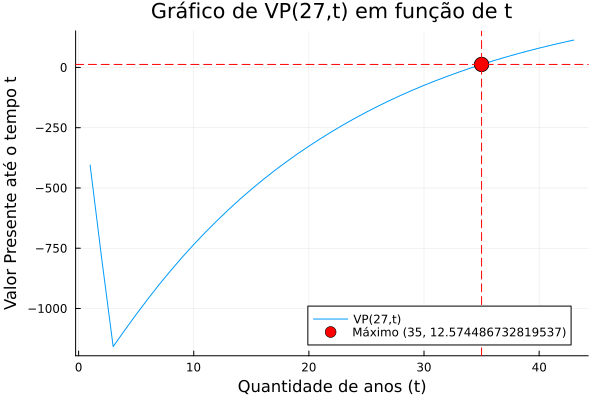

In [ ]:
vp_t = []
payback_descontado = -1
vp = 0
for t in 1:T_c+T_u
  aux = mean([VP(Q_optimal, t, π) for π in precos])
  push!(vp_t, aux)
end
for t in 1:T_c+T_u
  if vp_t[t] > 0
    vp = vp_t[t]
    payback_descontado = t
    break
  end
end

println("O payback descontado se dá em t = $(payback_descontado)\n")
plot(1:T_c+T_u, vp_t, xlabel="Quantidade de anos (t)", ylabel="Valor Presente até o tempo t", label="VP(27,t)", title="Gráfico de VP(27,t) em função de t")
scatter!([payback_descontado], [vp], label="Máximo ($payback_descontado, $vp)", markersize=8, markercolor=:red)
vline!([payback_descontado], linestyle=:dash, linecolor=:red, label="")
hline!([vp], linestyle=:dash, linecolor=:red, label="")

#Questão 9


In [ ]:
] add DecisionProgramming GraphViz GraphvizDotLang Ipopt JuMP HiGHS

   Resolving package versions...
   Installed OpenBLAS32_jll ────── v0.3.24+0
   Installed MUMPS_seq_jll ─────── v500.700.301+0
   Installed METIS_jll ─────────── v5.1.3+0
   Installed Hwloc_jll ─────────── v2.12.0+0
   Installed SPRAL_jll ─────────── v2024.5.8+0
   Installed Graphviz_jll ──────── v2.50.0+1
   Installed Ipopt_jll ─────────── v300.1400.1700+0
   Installed ASL_jll ───────────── v0.1.3+0
   Installed GraphViz ──────────── v0.2.0
   Installed DecisionProgramming ─ v2.0.0
   Installed Ipopt ─────────────── v1.8.0
   Installed GraphvizDotLang ───── v0.2.1
    Updating `~/.julia/environments/v1.10/Project.toml`
  [0e836bf4] + DecisionProgramming v2.0.0
  [f526b714] + GraphViz v0.2.0
  [6039e64d] + GraphvizDotLang v0.2.1
  [b6b21f68] + Ipopt v1.8.0
    Updating `~/.julia/environments/v1.10/Manifest.toml`
  [0e836bf4] + DecisionProgramming v2.0.0
  [f526b714] + GraphViz v0.2.0
  [6039e64d] + GraphvizDotLang v0.2.1
  [b6b21f68] + Ipopt v1.8.0
  [ae81ac8f] + ASL_jll v0.1.3+0
  [3

In [ ]:
using DecisionProgramming ,GraphViz, GraphvizDotLang, Ipopt, JuMP, HiGHS

##a)


In [ ]:
using GraphvizDotLang: digraph, node, edge, attr, save

g = digraph("Q9DecisionTree", bgcolor="white", rankdir="LR") |>
    attr(:node; fontname="Helvetica", fontsize="11") |>
    attr(:edge; fontname="Helvetica", fontsize="10") |>

    node("Investir", label="Decisão de Investimento", shape="box", style="filled", fillcolor="lightgray") |>

    node("Novo", label="Novo Produto", shape="ellipse", style="filled", fillcolor="lightblue") |>
    node("Fixa", label="150", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white",width="0.9",height="0.6",fixedsize="true") |>

    edge("Investir", "Novo", label="Escolher Novo") |>
    edge("Investir", "Fixa", label="Escolher Fixa")

cenarios = [
    ("ω1", "20%", 135.91),
    ("ω2", "25%", 165.33),
    ("ω3", "10%", 161.16),
    ("ω4", "30%", 102.44),
    ("ω5", "15%", 120.00)
]

for (ω, prob, retorno) in cenarios
    g = g |>
        node(ω, label=ω, shape="circle", style="filled", fillcolor="white", color="darkred", fontcolor="darkred") |>
        node("R_$ω", label="$(retorno)", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="0.9",height="0.6",fixedsize="true") |>
        edge("Novo", ω, label=prob) |>
        edge(ω, "R_$ω")
end

save(g, "arvore_q9_julia.dot")

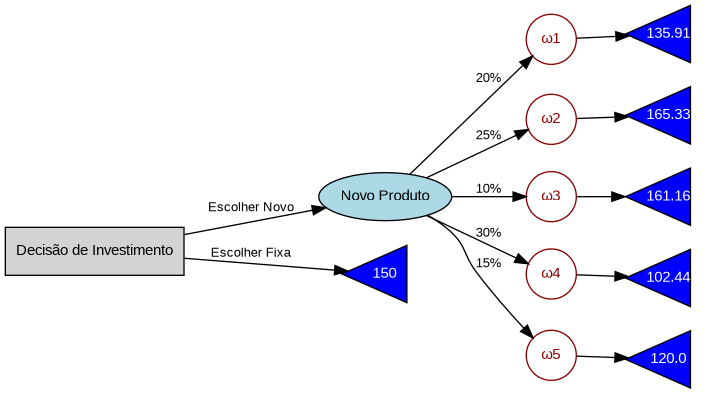

In [ ]:
g

In [ ]:
# -----------------------------
# 1. PARÂMETROS DO PROBLEMA
# -----------------------------

function R(q_tilde_1, q_tilde_2)
  return 10*q_tilde_2 + 50*exp(-0.5*q_tilde_1) + 5*q_tilde_2*q_tilde_1
end

fatores = [
  -2.00 1.00
  1.00 9.00
  3.00 6.00
  -1.00 4.00
  0.00 7.00
]

n_cenarios = 5
ω = Vector{String}(undef, n_cenarios)
r_ω = Vector{Float64}(undef, n_cenarios)

p_ω = [0.20, 0.25, 0.10, 0.30, 0.15]

for i in 1:5
  ω[i] = "ω$(i)"
  r_ω[i]  = R(fatores[i,1], fatores[i,2])
end

# Valor fixo da renda fixa
r_fixo = 150.0

# -----------------------------
# 2. CONSTRUÇÃO DO DIAGRAMA
# -----------------------------

function BuildDiagram(n_cenarios::Int64, ω::Vector{String}, r_ω::Vector{Float64}, p_ω::Vector{Float64}, r_fixo::Float64)
  diagram = InfluenceDiagram()

  # Decisão: "Investir" → [NovoProduto, RendaFixa]
  add_node!(diagram, DecisionNode("Investir", [], ["Novo", "Fixa"]))

  # Incerteza: "Cenário Econômico" → ω1 ... ω5
  add_node!(diagram, ChanceNode("Cenario", [], ω))

  # Valor: Payoff depende de (Investir, Cenário)
  add_node!(diagram, ValueNode("Payoff", ["Investir", "Cenario"]))

  generate_arcs!(diagram)

  # -----------------------------
  # 3. PROBABILIDADES
  # -----------------------------

  ProbMatrix = ProbabilityMatrix(diagram, "Cenario")

  for i in 1:n_cenarios
      ProbMatrix[ω[i]] = p_ω[i]
  end
  add_probabilities!(diagram, "Cenario", ProbMatrix)

  # -----------------------------
  # 4. UTILIDADES (RETORNOS)
  # -----------------------------

  Payoff = UtilityMatrix(diagram, "Payoff")

  for i in 1:n_cenarios
      Payoff["Novo", ω[i]] = r_ω[i]
      Payoff["Fixa", ω[i]] = r_fixo
  end

  add_utilities!(diagram, "Payoff", Payoff)

  # -----------------------------
  # 5. OTIMIZAÇÃO DO MODELO
  # -----------------------------

  generate_diagram!(diagram)
  model = Model(HiGHS.Optimizer)

  z = DecisionVariables(model, diagram)
  x_s = PathCompatibilityVariables(model, diagram, z)
  EV = expected_value(model, diagram, x_s)
  println(typeof(EV))
  @objective(model, Max, EV)
  optimize!(model)

  # -----------------------------
  # 6. RESULTADOS
  # -----------------------------

  zOpt = DecisionStrategy(diagram, z)
  S_probabilities = StateProbabilities(diagram, zOpt)
  U_distribution = UtilityDistribution(diagram, zOpt)

  print_decision_strategy(diagram, zOpt, S_probabilities)
  print_utility_distribution(U_distribution)
  print_statistics(U_distribution)
end



BuildDiagram (generic function with 1 method)

In [ ]:
BuildDiagram(n_cenarios, ω, r_ω, p_ω, r_fixo)

AffExpr
Running HiGHS 1.10.0 (git hash: fd8665394e): Copyright (c) 2025 HiGHS under MIT licence terms
MIP  has 4 rows; 12 cols; 24 nonzeros; 2 integer variables (2 binary)
Coefficient ranges:
  Matrix [1e-01, 5e+00]
  Cost   [2e+01, 4e+01]
  Bound  [1e+00, 1e+00]
  RHS    [1e+00, 1e+00]
Presolving model
3 rows, 11 cols, 22 nonzeros  0s
3 rows, 1 cols, 0 nonzeros  0s
0 rows, 0 cols, 0 nonzeros  0s
Presolve: Optimal

Src: B => Branching; C => Central rounding; F => Feasibility pump; H => Heuristic; L => Sub-MIP;
     P => Empty MIP; R => Randomized rounding; S => Solve LP; T => Evaluate node; U => Unbounded;
     z => Trivial zero; l => Trivial lower; u => Trivial upper; p => Trivial point; X => User solution

        Nodes      |    B&B Tree     |            Objective Bounds              |  Dynamic Constraints |       Work      
Src  Proc. InQueue |  Leaves   Expl. | BestBound       BestSol              Gap |   Cuts   InLp Confl. | LpIters     Time

         0       0         0   0.00% 

In [ ]:
r_ω, p_ω = sort(r_ω), p_ω[sortperm(r_ω)]
cdf_novo = cumsum(p_ω)

5-element Vector{Float64}:
 0.3
 0.44999999999999996
 0.6499999999999999
 0.75
 1.0

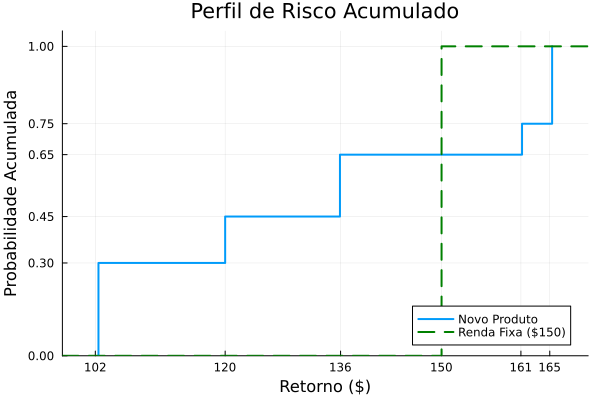

In [ ]:
ret_plot = [minimum(r_ω) - 1e-3; r_ω]
cdf_plot = [0.0; cdf_novo]

xticks_total = sort(unique([r_ω; r_fixo]))
yticks_total = sort(unique([0.0; cdf_novo; 1.0]))

plot(ret_plot, cdf_plot,
     label="Novo Produto", lw=2, line=:step, legend=:bottomright,
     xlabel="Retorno (\$)", ylabel="Probabilidade Acumulada",
     title="Perfil de Risco Acumulado", grid=true,
     xticks=round.(xticks_total),
     yticks=yticks_total,
     xlims=(minimum(ret_plot)-5, maximum(r_ω)+5),
     ylims=(0, 1.05))

plot!([0, r_fixo, r_fixo, maximum(r_ω)+5],
      [0, 0, 1, 1],
      label="Renda Fixa (\$150)", lw=2, line=:step, color=:green, linestyle=:dash)

##b)

In [ ]:
p_ω_150 = sum(p_ω[i] for i in 1:n_cenarios if r_ω[i] > 150)

println("Probabilidade do novo produto superar a renda fixa: ", round(p_ω_150*100, digits=2), "%")

Probabilidade do novo produto superar a renda fixa: 35.0%


##c)

In [ ]:
Random.seed!(13)
n_cenarios = 10000

q1  = Vector{Float64}(undef,n_cenarios)
q2  = Vector{Float64}(undef,n_cenarios)
ω   = Vector{String}(undef,n_cenarios)
p_ω = Vector{Float64}(undef,n_cenarios)
r_ω = Vector{Float64}(undef,n_cenarios)
for i in 1:n_cenarios
  q1[i]   = rand(Uniform(-2, 7))
  q2[i]   = rand(Uniform(q1[i], 10))
  r_ω[i]  = R(q1[i],q2[i])
  ω[i]    = "ω$i"
  p_ω[i]  = 1/n_cenarios
end


ExpValue = mean(r_ω)
if ExpValue > r_fixo
  println("A decisão ótima é investir no produto novo. VP = $ExpValue")
else
  println("A decisão ótima é ficar na renda fixa. VP = $r_fixo")
end

A decisão ótima é investir no produto novo. VP = 187.63690602320054


##d)

In [ ]:
m = Model(Ipopt.Optimizer)

@variable(m, q1)
@variable(m, q2)

@constraint(m, -2 <= q1)
@constraint(m, q1 <= 7)
@constraint(m, q1 <= q2)
@constraint(m, q2 <= 7)

@NLobjective(m, Min, 10*q2 + 50*exp(-0.5*q1) + 5*q1*q2)
optimize!(m)

q1_opt = value(q1)
q2_opt = value(q2)
r_min = objective_value(m)

This is Ipopt version 3.14.17, running with linear solver MUMPS 5.7.3.

Number of nonzeros in equality constraint Jacobian...:        0
Number of nonzeros in inequality constraint Jacobian.:        5
Number of nonzeros in Lagrangian Hessian.............:        3

Total number of variables............................:        2
                     variables with only lower bounds:        0
                variables with lower and upper bounds:        0
                     variables with only upper bounds:        0
Total number of equality constraints.................:        0
Total number of inequality constraints...............:        4
        inequality constraints with only lower bounds:        0
   inequality constraints with lower and upper bounds:        0
        inequality constraints with only upper bounds:        4

iter    objective    inf_pr   inf_du lg(mu)  ||d||  lg(rg) alpha_du alpha_pr  ls
   0  5.0000000e+01 0.00e+00 7.09e+00  -1.0 0.00e+00    -  0.00e+00 0.00e+00 

44.67425165777297

In [ ]:
println("Pior caso encontrado:")
println("q1 = $(round(q1_opt, digits=2)), q2 = $(round(q2_opt, digits=2))")
println("Valor mínimo de retorno (pior caso): R(q1, q2) = $(round(r_min, digits=2))")

if r_min < 150
    println("Com aversão à ambiguidade, melhor não investir no Novo Produto.")
else
    println("Mesmo no pior caso, vale a pena investir no Novo Produto.")
end

Pior caso encontrado:
q1 = 0.73, q2 = 0.73
Valor mínimo de retorno (pior caso): R(q1, q2) = 44.67
Com aversão à ambiguidade, melhor não investir no Novo Produto.


#Questão 14

In [28]:
] add DecisionProgramming JuMP HiGHS Plots DataFrames XLSX GraphvizDotLang

   Resolving package versions...
   Installed EzXML ────────── v1.2.1
   Installed ZipFile ──────── v0.10.1
   Installed XLSX ─────────── v0.10.4
   Installed CodecInflate64 ─ v0.1.3
   Installed ZipArchives ──── v2.4.1
   Installed InputBuffers ─── v1.0.1
    Updating `~/.julia/environments/v1.10/Project.toml`
  [fdbf4ff8] + XLSX v0.10.4
    Updating `~/.julia/environments/v1.10/Manifest.toml`
  [6309b1aa] + CodecInflate64 v0.1.3
  [8f5d6c58] + EzXML v1.2.1
  [0c81fc1b] + InputBuffers v1.0.1
  [fdbf4ff8] + XLSX v0.10.4
  [49080126] + ZipArchives v2.4.1
  [a5390f91] + ZipFile v0.10.1
Precompiling packages...
   2514.7 ms  ✓ InputBuffers
   2302.2 ms  ✓ CodecInflate64
   2779.7 ms  ✓ ZipFile
   1774.2 ms  ✓ EzXML
  13283.2 ms  ✓ ZipArchives
   1446.8 ms  ✓ XLSX
  6 dependencies successfully precompiled in 20 seconds. 480 already precompiled.


In [29]:
using JuMP, HiGHS, DecisionProgramming, Plots, DataFrames, XLSX, GraphvizDotLang

##a)

In [30]:
# ===================== Parâmetros =========================
X = [300.0, 600.0]                     # Contratos possíveis (MWh)
π = 45.0                               # Receita por MWh
multa = 100.0                          # Multa por MWh não entregue
eficiencia = 3.0                       # MWh/MMBtu
demanda_gas = X ./ eficiencia          # Demanda de gás para cada contrato

# Custos por MMBtu
c_normal = 70.0
c_alto = 100.0
prob_preco = Dict("Normal" => 0.85, "Alto" => 0.15)

# Entrega
prob_entrega = Dict("Total" => 0.60, "Parcial" => 0.40)

# Aumento de custo em entrega parcial
aumento_parcial = 1.10

# ===================== Diagrama de Influência =========================
diagram = InfluenceDiagram()

add_node!(diagram, DecisionNode("Contrato", [], ["X1", "X2"]))  # Escolha do contrato
add_node!(diagram, ChanceNode("PrecoGas", [], ["Normal", "Alto"]))
add_node!(diagram, ChanceNode("Entrega", [], ["Total", "Parcial"]))
add_node!(diagram, ValueNode("Lucro", ["Contrato", "PrecoGas", "Entrega"]))

generate_arcs!(diagram)

# ===================== Probabilidades =========================
p_preco = ProbabilityMatrix(diagram, "PrecoGas")
p_preco["Normal"] = 0.85
p_preco["Alto"] = 0.15
add_probabilities!(diagram, "PrecoGas", p_preco)

p_entrega = ProbabilityMatrix(diagram, "Entrega")
p_entrega["Total"] = 0.60
p_entrega["Parcial"] = 0.40
add_probabilities!(diagram, "Entrega", p_entrega)

# ===================== Utilidade (Lucro) =========================
u = UtilityMatrix(diagram, "Lucro")

for contrato in ["X1", "X2"], preco in ["Normal", "Alto"], entrega in ["Total", "Parcial"]
    x = contrato == "X1" ? X[1] : X[2]
    demanda = x / eficiencia
    preco_gas = preco == "Normal" ? c_normal : c_alto
    preco_gas *= entrega == "Parcial" ? aumento_parcial : 1.0
    fornecido = entrega == "Parcial" ? 0.5 * x : x

    receita = π * fornecido
    penalidade = multa * max(0.0, x - fornecido)
    custo = preco_gas * fornecido / eficiencia

    lucro = receita - custo - penalidade
    u[contrato, preco, entrega] = lucro
end

add_utilities!(diagram, "Lucro", u)
generate_diagram!(diagram)

# ===================== Solução =========================
model = Model(HiGHS.Optimizer)
z = DecisionVariables(model, diagram)
x_s = PathCompatibilityVariables(model, diagram, z)

@objective(model, Max, expected_value(model, diagram, x_s))
optimize!(model)

# ===================== Resultados =========================
z_opt = DecisionStrategy(diagram, z)
S_probabilities = StateProbabilities(diagram, z_opt)

println("Estratégia ótima:")
print_decision_strategy(diagram, z_opt, S_probabilities)

U_dist = UtilityDistribution(diagram, z_opt)
print_utility_distribution(U_dist)
print_statistics(U_dist)
println("EVPL = $(objective_value(model))")

Running HiGHS 1.10.0 (git hash: fd8665394e): Copyright (c) 2025 HiGHS under MIT licence terms
MIP  has 4 rows; 10 cols; 20 nonzeros; 2 integer variables (2 binary)
Coefficient ranges:
  Matrix [6e-02, 4e+00]
  Cost   [3e+02, 8e+03]
  Bound  [1e+00, 1e+00]
  RHS    [1e+00, 1e+00]
Presolving model
3 rows, 9 cols, 18 nonzeros  0s
3 rows, 1 cols, 0 nonzeros  0s
0 rows, 0 cols, 0 nonzeros  0s
Presolve: Optimal

Src: B => Branching; C => Central rounding; F => Feasibility pump; H => Heuristic; L => Sub-MIP;
     P => Empty MIP; R => Randomized rounding; S => Solve LP; T => Evaluate node; U => Unbounded;
     z => Trivial zero; l => Trivial lower; u => Trivial upper; p => Trivial point; X => User solution

        Nodes      |    B&B Tree     |            Objective Bounds              |  Dynamic Constraints |       Work      
Src  Proc. InQueue |  Leaves   Expl. | BestBound       BestSol              Gap |   Cuts   InLp Confl. | LpIters     Time

         0       0         0   0.00%   -1309  

In [31]:
using GraphvizDotLang: digraph, node, edge, attr, save

u = Dict{Tuple{String,String,String}, Float64}()
for contrato in ["X1", "X2"], preco in ["Normal", "Alto"], entrega in ["Total", "Parcial"]
    x = contrato == "X1" ? X[1] : X[2]
    demanda = x / eficiencia
    preco_gas = preco == "Normal" ? c_normal : c_alto
    preco_gas *= entrega == "Parcial" ? aumento_parcial : 1.0
    fornecido = entrega == "Parcial" ? 0.5 * x : x

    receita = π * fornecido
    penalidade = multa * max(0.0, x - fornecido)
    custo = preco_gas * fornecido / eficiencia

    lucro = receita - custo - penalidade
    u[contrato, preco, entrega] = lucro
end

g = digraph("Q14DecisionTree", bgcolor="white", rankdir="LR") |>
    attr(:node; fontname="Helvetica", fontsize="11") |>
    attr(:edge; fontname="Helvetica", fontsize="10") |>

    node("Contrato", label="Escolha de contrato", shape="box", style="filled", fillcolor="green") |>

    node("Preco1", label="Preco", shape="circle", style="filled", fillcolor="darkred") |>
    node("Preco2", label="Preco", shape="circle", style="filled", fillcolor="darkred") |>

    edge("Contrato", "Preco1", label="Contrato X1") |>
    edge("Contrato", "Preco2", label="Contrato X2") |>

    node("Entrega1", label="Entrega", shape="circle", style="filled", fillcolor="darkred") |>
    node("Entrega2", label="Entrega", shape="circle", style="filled", fillcolor="darkred") |>
    node("Entrega3", label="Entrega", shape="circle", style="filled", fillcolor="darkred") |>
    node("Entrega4", label="Entrega", shape="circle", style="filled", fillcolor="darkred") |>

    edge("Preco1", "Entrega1", label="alto, p=$(p_preco[2])") |>
    edge("Preco1", "Entrega2", label="normal, p=$(p_preco[1])") |>
    edge("Preco2", "Entrega3", label="alto, p=$(p_preco[2])") |>
    edge("Preco2", "Entrega4", label="normal, p=$(p_preco[1])") |>

    node("Final1", label="$(round((u["X1","Alto","Total"])))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("Final2", label="$(round((u["X1","Alto","Parcial"])))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("Final3", label="$(round((u["X1","Normal","Total"])))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("Final4", label="$(round((u["X1","Normal","Parcial"])))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("Final5", label="$(round((u["X2","Alto","Total"])))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("Final6", label="$(round((u["X2","Alto","Parcial"])))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("Final7", label="$(round((u["X2","Normal","Total"])))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("Final8", label="$(round((u["X2","Normal","Parcial"])))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>

    edge("Entrega1", "Final1", label="total, $(p_entrega[1])") |>
    edge("Entrega1", "Final2", label="parcial, $(p_entrega[2])") |>
    edge("Entrega2", "Final3", label="total, $(p_entrega[1])") |>
    edge("Entrega2", "Final4", label="parcial, $(p_entrega[2])") |>
    edge("Entrega3", "Final5", label="total, $(p_entrega[1])") |>
    edge("Entrega3", "Final6", label="parcial, $(p_entrega[2])") |>
    edge("Entrega4", "Final7", label="total, $(p_entrega[1])") |>
    edge("Entrega4", "Final8", label="parcial, $(p_entrega[2])")

# Salva como arquivo .dot
save(g, "arvore_q14_julia.dot")

In [ ]:
u

2×2×2 UtilityMatrix{3}:
[:, :, 1] =
  6500.0  3500.0
 13000.0  7000.0

[:, :, 2] =
 -12100.0  -13750.0
 -24200.0  -27500.0

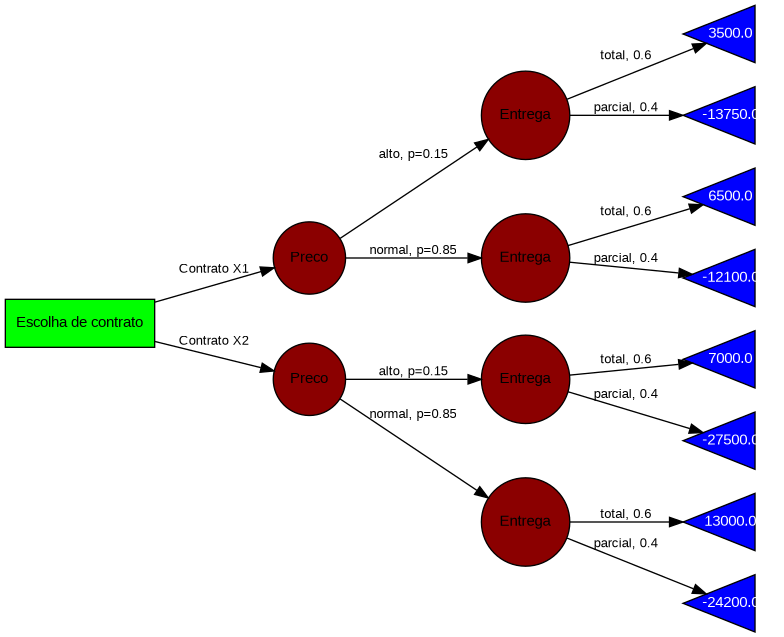

In [32]:
g

##b)

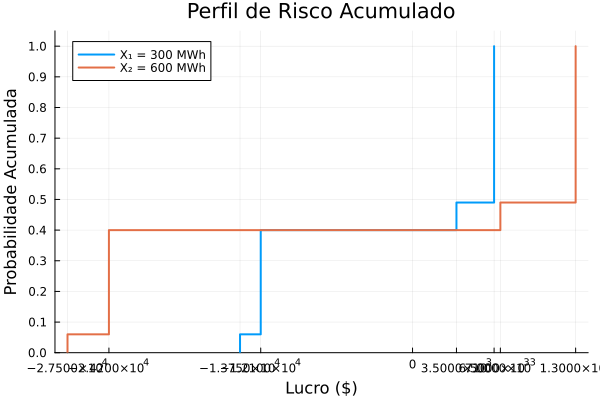

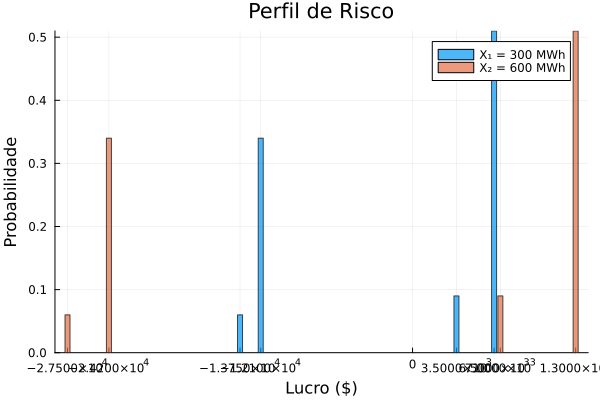

"/content/perfil_risco.png"

In [42]:

lucros_X1 = [u["X1","Alto","Parcial"], u["X1","Normal","Parcial"], u["X1","Alto","Total"], u["X1","Normal","Total"]]
probabilidades_X1 = [0.15*0.40, 0.85*0.40, 0.15*0.60, 0.85*0.60]

lucros_X2 = [u["X2","Alto","Parcial"], u["X2","Normal","Parcial"], u["X2","Alto","Total"], u["X2","Normal","Total"]]
probabilidades_X2 = [0.15*0.40, 0.85*0.40, 0.15*0.60, 0.85*0.60]


function criar_perfil_corrigido(lucros, probs)

    ordem = sortperm(lucros)
    lucros_ord = lucros[ordem]
    probs_ord = probs[ordem]


    x_points = [-Inf; lucros_ord[1]]
    y_points = [0.0; 0.0]


    prob_acum = 0.0
    for i in 1:length(lucros_ord)
        prob_acum += probs_ord[i]
        push!(x_points, lucros_ord[i])
        push!(y_points, prob_acum)
        if i < length(lucros_ord)
            push!(x_points, lucros_ord[i+1])
            push!(y_points, prob_acum)
        end
    end


    push!(x_points, Inf)
    push!(y_points, 1.0)

    return x_points, y_points
end


x_X1, y_X1 = criar_perfil_corrigido(lucros_X1, probabilidades_X1)
x_X2, y_X2 = criar_perfil_corrigido(lucros_X2, probabilidades_X2)


xticks_values = sort(unique(vcat(lucros_X1, lucros_X2)))
yticks_values = 0:0.1:1


p1 = plot([x_X1, x_X2], [y_X1, y_X2],
         label=["X₁ = 300 MWh" "X₂ = 600 MWh"],
         xlabel="Lucro (\$)", ylabel="Probabilidade Acumulada",
         title="Perfil de Risco Acumulado",
         linetype=:steppost, linewidth=2,
         xticks=[xticks_values;0], yticks=yticks_values,
         xlims=(minimum(xticks_values)-1000, maximum(xticks_values)+1000),
         ylims=(0, 1.05),
         legend=:topleft,
         grid=true)


p2 = bar([lucros_X1, lucros_X2], [probabilidades_X1, probabilidades_X2],
         label=["X₁ = 300 MWh" "X₂ = 600 MWh"],
         xlabel="Lucro (\$)", ylabel="Probabilidade",
         title="Perfil de Risco",
         bar_width=400, alpha=0.7,
         xticks=[xticks_values;0], yticks=0:0.1:0.6,
         xlims=(minimum(xticks_values)-1000, maximum(xticks_values)+1000),
         legend=:topright,
         grid=true)


display(p1)
display(p2)
savefig(p1, "perfil_risco_acumulado.png")
savefig(p2, "perfil_risco.png")

In [ ]:
function probabilidade_receita_negativa(u, contrato)
    prob_neg = 0.0
    for (key, lucro) in u
        if key[1] == contrato && lucro < 0
            preco = key[2]
            entrega = key[3]
            prob_neg += prob_preco[preco] * prob_entrega[entrega]
        end
    end
    return prob_neg
end


prob_neg_X1 = probabilidade_receita_negativa(u, "X1")
prob_neg_X2 = probabilidade_receita_negativa(u, "X2")


println("Probabilidade de Receita Líquida Negativa:")
println("----------------------------------------")
println("X₁ = 300 MWh: ", round(prob_neg_X1 * 100, digits=2), "%")
println("X₂ = 600 MWh: ", round(prob_neg_X2 * 100, digits=2), "%")

println("\nDetalhamento dos Cenários Negativos:")
for (key, lucro) in u
    if lucro < 0
        contrato, preco, entrega = key
        prob = prob_preco[preco] * prob_entrega[entrega]
        println("Contrato ", contrato, ":")
        println("  Cenário: Preço ", preco, " + Entrega ", entrega)
        println("  Lucro: \$", round(lucro, digits=2))
        println("  Probabilidade: ", round(prob * 100, digits=2), "%")
        println("----------------------------------------")
    end
end

Probabilidade de Receita Líquida Negativa:
----------------------------------------
X₁ = 300 MWh: 40.0%
X₂ = 600 MWh: 40.0%

Detalhamento dos Cenários Negativos:
Contrato X2:
  Cenário: Preço Normal + Entrega Parcial
  Lucro: $-24200.0
  Probabilidade: 34.0%
----------------------------------------
Contrato X1:
  Cenário: Preço Normal + Entrega Parcial
  Lucro: $-12100.0
  Probabilidade: 34.0%
----------------------------------------
Contrato X2:
  Cenário: Preço Alto + Entrega Parcial
  Lucro: $-27500.0
  Probabilidade: 6.0%
----------------------------------------
Contrato X1:
  Cenário: Preço Alto + Entrega Parcial
  Lucro: $-13750.0
  Probabilidade: 6.0%
----------------------------------------


##c)

In [44]:
# ===================== Diagrama de Influência com Informação Perfeita =========================
diagram_perfeito = InfluenceDiagram()

add_node!(diagram_perfeito, DecisionNode("Contrato", [], ["X1", "X2"]))
add_node!(diagram_perfeito, ChanceNode("PrecoGas", [], ["Normal", "Alto"]))
add_node!(diagram_perfeito, ChanceNode("Entrega", [], ["Total", "Parcial"]))
add_node!(diagram_perfeito, ValueNode("Lucro", ["Contrato", "PrecoGas", "Entrega"]))

generate_arcs!(diagram_perfeito)

# ===================== Probabilidades =========================
p_preco_perfeito = ProbabilityMatrix(diagram_perfeito, "PrecoGas")
p_preco_perfeito["Normal"] = 1.0
p_preco_perfeito["Alto"] = 0.0
add_probabilities!(diagram_perfeito, "PrecoGas", p_preco_perfeito)

p_entrega_perfeito = ProbabilityMatrix(diagram_perfeito, "Entrega")
p_entrega_perfeito["Total"] = 0.60
p_entrega_perfeito["Parcial"] = 0.40
add_probabilities!(diagram_perfeito, "Entrega", p_entrega_perfeito)

# ===================== Utilidade (Lucro) =========================
u_perfeito = UtilityMatrix(diagram_perfeito, "Lucro")

for contrato in ["X1", "X2"], preco in ["Normal", "Alto"], entrega in ["Total", "Parcial"]
    x = contrato == "X1" ? X[1] : X[2]
    demanda = x / eficiencia
    preco_gas = preco == "Normal" ? c_normal : c_alto
    preco_gas *= entrega == "Parcial" ? aumento_parcial : 1.0
    fornecido = entrega == "Parcial" ? 0.5 * x : x

    receita = π * fornecido
    penalidade = multa * max(0.0, x - fornecido)
    custo = preco_gas * fornecido / eficiencia

    lucro = receita - custo - penalidade
    u_perfeito[contrato, preco, entrega] = lucro
end

add_utilities!(diagram_perfeito, "Lucro", u_perfeito)
generate_diagram!(diagram_perfeito)

# ===================== Solução com Informação Perfeita =========================
model_perfeito = Model(HiGHS.Optimizer)
z_perfeito = DecisionVariables(model_perfeito, diagram_perfeito)
x_s_perfeito = PathCompatibilityVariables(model_perfeito, diagram_perfeito, z_perfeito)

@objective(model_perfeito, Max, expected_value(model_perfeito, diagram_perfeito, x_s_perfeito))
optimize!(model_perfeito)

# ===================== Resultados com Informação Perfeita =========================
z_opt_perfeito = DecisionStrategy(diagram_perfeito, z_perfeito)
S_probabilities_perfeito = StateProbabilities(diagram_perfeito, z_opt_perfeito)

println(" Estratégia ótima com informação perfeita:")
print_decision_strategy(diagram_perfeito, z_opt_perfeito, S_probabilities_perfeito)

U_dist_perfeito = UtilityDistribution(diagram_perfeito, z_opt_perfeito)
print_utility_distribution(U_dist_perfeito)
print_statistics(U_dist_perfeito)

# ===================== Cálculo do Valor da Consultoria =========================

valor_sem_info_perfeita = objective_value(model)


valor_com_info_perfeita = objective_value(model_perfeito)

valor_consultoria = valor_com_info_perfeita - valor_sem_info_perfeita

println("\n Valor máximo que a multinacional pagaria pela consultoria (informação perfeita): ", valor_consultoria)

Running HiGHS 1.10.0 (git hash: fd8665394e): Copyright (c) 2025 HiGHS under MIT licence terms
MIP  has 4 rows; 6 cols; 12 nonzeros; 2 integer variables (2 binary)
Coefficient ranges:
  Matrix [4e-01, 2e+00]
  Cost   [4e+03, 1e+04]
  Bound  [1e+00, 1e+00]
  RHS    [1e+00, 1e+00]
Presolving model
3 rows, 5 cols, 10 nonzeros  0s
3 rows, 1 cols, 0 nonzeros  0s
0 rows, 0 cols, 0 nonzeros  0s
Presolve: Optimal

Src: B => Branching; C => Central rounding; F => Feasibility pump; H => Heuristic; L => Sub-MIP;
     P => Empty MIP; R => Randomized rounding; S => Solve LP; T => Evaluate node; U => Unbounded;
     z => Trivial zero; l => Trivial lower; u => Trivial upper; p => Trivial point; X => User solution

        Nodes      |    B&B Tree     |            Objective Bounds              |  Dynamic Constraints |       Work      
Src  Proc. InQueue |  Leaves   Expl. | BestBound       BestSol              Gap |   Cuts   InLp Confl. | LpIters     Time

         0       0         0   0.00%   -940    

##d)

In [47]:
df = DataFrame(XLSX.readtable("/content/Questao15 - Historico Consultoria.xlsx", "Historico_Consultoria"))
p_Pnormal   = size(filter(row -> row."Previsao Consultoria" == "Preço Normal", df))[1] / size(df)[1]

0.6586931155192532

In [48]:
p_Pnormal_e_Ralto = nrow(filter(row -> row."Previsao Consultoria" == "Preço Normal" && row."Realização Mercado" == "Preço Alto", df)) / nrow(df)
p_Ralto_dado_Pnormal = p_Pnormal_e_Ralto / p_Pnormal

0.036568391749968364

In [49]:
p_Ralto_dado_Pnormal = nrow(filter(row -> row."Previsao Consultoria" == "Preço Normal" && row."Realização Mercado" == "Preço Alto", df)) / nrow(filter(row -> row."Previsao Consultoria" == "Preço Normal", df))

0.036568391749968364

##e)

In [50]:
# ===================== Probabilidades empíricas =====================
prob_previsao = Dict{String, Float64}()
for previsao in ["Preço Normal", "Preço Alto"]
    prob_previsao[previsao] = size(filter(row -> row."Previsao Consultoria" == previsao, df))[1] / size(df)[1]
end

prob_condicional = Dict{String, Dict{String, Float64}}()
for previsao in ["Preço Normal", "Preço Alto"]
    sub_df = filter(row -> row."Previsao Consultoria" == previsao, df)
    total = size(sub_df)[1]
    prob_condicional[previsao] = Dict()
    for realizacao in ["Preço Normal", "Preço Alto"]
        prob_condicional[previsao][realizacao] = size(filter(row -> row."Realização Mercado" == realizacao, sub_df))[1] / total
    end
end

# ===================== Parâmetros fixos do problema =====================
X = [300.0, 600.0]                     # Contratos possíveis (MWh)
π = 45.0                               # Receita por MWh
multa = 100.0                          # Multa por MWh não entregue
eficiencia = 3.0                       # MWh/MMBtu
c_normal = 70.0
c_alto = 100.0
aumento_parcial = 1.10
prob_entrega = Dict("Total" => 0.60, "Parcial" => 0.40)

# ===================== Função para calcular valor esperado com previsão =====================
function valor_esperado_com_previsao(previsao::String)
    diagram = InfluenceDiagram()

    add_node!(diagram, DecisionNode("Contrato", [], ["X1", "X2"]))  # Escolha após previsão
    add_node!(diagram, ChanceNode("PrecoGas", [], ["Preço Normal", "Preço Alto"]))
    add_node!(diagram, ChanceNode("Entrega", [], ["Total", "Parcial"]))
    add_node!(diagram, ValueNode("Lucro", ["Contrato", "PrecoGas", "Entrega"]))

    generate_arcs!(diagram)

    # Probabilidades condicionais para preço do gás
    p_preco = ProbabilityMatrix(diagram, "PrecoGas")
    for estado in ["Preço Normal", "Preço Alto"]
        p_preco[estado] = prob_condicional[previsao][estado]
    end
    add_probabilities!(diagram, "PrecoGas", p_preco)

    # Probabilidades da entrega (iguais para ambos os casos)
    p_entrega = ProbabilityMatrix(diagram, "Entrega")
    for estado in ["Total", "Parcial"]
        p_entrega[estado] = prob_entrega[estado]
    end
    add_probabilities!(diagram, "Entrega", p_entrega)

    # Lucro
    u = UtilityMatrix(diagram, "Lucro")
    for contrato in ["X1", "X2"], preco in ["Preço Normal", "Preço Alto"], entrega in ["Total", "Parcial"]
        x = contrato == "X1" ? X[1] : X[2]
        preco_gas = preco == "Preço Normal" ? c_normal : c_alto
        preco_gas *= entrega == "Parcial" ? aumento_parcial : 1.0
        fornecido = entrega == "Parcial" ? 0.5 * x : x

        receita = π * fornecido
        penalidade = multa * max(0.0, x - fornecido)
        custo = preco_gas * fornecido / eficiencia

        lucro = receita - custo - penalidade
        u[contrato, preco, entrega] = lucro
    end
    add_utilities!(diagram, "Lucro", u)
    generate_diagram!(diagram)

    model = Model(HiGHS.Optimizer)
    z = DecisionVariables(model, diagram)
    x_s = PathCompatibilityVariables(model, diagram, z)

    @objective(model, Max, expected_value(model, diagram, x_s))
    optimize!(model)

    return objective_value(model)
end

# ===================== Cálculo final da informação imperfeita =====================
v_normal = valor_esperado_com_previsao("Preço Normal")
v_alto = valor_esperado_com_previsao("Preço Alto")

valor_imperfeito = prob_previsao["Preço Normal"] * v_normal + prob_previsao["Preço Alto"] * v_alto

# ===================== Comparar com valor sem informação =====================
valor_sem_info_perfeita = objective_value(model)

custo_servico = 50.0
ganho_liquido = valor_imperfeito - valor_sem_info_perfeita

println("Valor esperado com consultoria (informação imperfeita): ", valor_imperfeito)
println("Valor esperado sem consultoria: ", valor_sem_info_perfeita)
println("Ganho líquido com consultoria: ", ganho_liquido)

if ganho_liquido ≥ custo_servico
    println("A multinacional deve contratar a consultoria (ganho ≥ \$50)")
else
    println("A multinacional NÃO deve contratar a consultoria (ganho < \$50)")
end

Running HiGHS 1.10.0 (git hash: fd8665394e): Copyright (c) 2025 HiGHS under MIT licence terms
MIP  has 4 rows; 10 cols; 20 nonzeros; 2 integer variables (2 binary)
Coefficient ranges:
  Matrix [1e-02, 4e+00]
  Cost   [8e+01, 9e+03]
  Bound  [1e+00, 1e+00]
  RHS    [1e+00, 1e+00]
Presolving model
3 rows, 9 cols, 18 nonzeros  0s
3 rows, 1 cols, 0 nonzeros  0s
0 rows, 0 cols, 0 nonzeros  0s
Presolve: Optimal

Src: B => Branching; C => Central rounding; F => Feasibility pump; H => Heuristic; L => Sub-MIP;
     P => Empty MIP; R => Randomized rounding; S => Solve LP; T => Evaluate node; U => Unbounded;
     z => Trivial zero; l => Trivial lower; u => Trivial upper; p => Trivial point; X => User solution

        Nodes      |    B&B Tree     |            Objective Bounds              |  Dynamic Constraints |       Work      
Src  Proc. InQueue |  Leaves   Expl. | BestBound       BestSol              Gap |   Cuts   InLp Confl. | LpIters     Time

         0       0         0   0.00%   -1029.9

#Questão 15

##a)

In [51]:
] add JuMP HiGHS Plots Distributions Statistics DecisionProgramming GraphViz GraphvizDotLang Ipopt Optim

   Resolving package versions...
   Installed PositiveFactorizations ─── v0.2.4
   Installed NLSolversBase ──────────── v7.9.0
   Installed Parameters ─────────────── v0.12.3
   Installed UnPack ─────────────────── v1.0.2
   Installed FiniteDiff ─────────────── v2.27.0
   Installed LineSearches ───────────── v7.3.0
   Installed Optim ──────────────────── v1.11.0
   Installed DifferentiationInterface ─ v0.6.50
    Updating `~/.julia/environments/v1.10/Project.toml`
  [429524aa] + Optim v1.11.0
    Updating `~/.julia/environments/v1.10/Manifest.toml`
  [a0c0ee7d] + DifferentiationInterface v0.6.50
  [6a86dc24] + FiniteDiff v2.27.0
  [d3d80556] + LineSearches v7.3.0
  [d41bc354] + NLSolversBase v7.9.0
  [429524aa] + Optim v1.11.0
  [d96e819e] + Parameters v0.12.3
  [85a6dd25] + PositiveFactorizations v0.2.4
  [3a884ed6] + UnPack v1.0.2
Precompiling packages...
   3194.1 ms  ✓ PositiveFactorizations
   3005.8 ms  ✓ UnPack
   1379.2 ms  ✓ Parameters
   1722.8 ms  ✓ FiniteDiff
   4937.1 ms  

In [52]:
using JuMP, HiGHS, Plots, Distributions, Statistics, DecisionProgramming, GraphViz, GraphvizDotLang, Ipopt, Optim

In [53]:
# ===================== Parâmetros =====================
P = 120.0                     # Receita por kg vendida à China
pi_c = 600.0                 # Custo de compra (quando produção é insuficiente)
pi_v = 12.0                  # Receita extra (quando há excesso)
G = Dict("omega1" => 115.0, "omega2" => 80.0)  # Produção em cada cenário
prob = Dict("omega1" => 0.5, "omega2" => 0.5)   # Probabilidades dos cenários

Q_opcoes = [80.0, 90.0, 100.0, 110.0, 115.0, 120.0, 125.0, 130.0]

# ===================== Diagrama de Influência =====================
diagram = InfluenceDiagram()

add_node!(diagram, DecisionNode("Quantidade", [], string.(Q_opcoes)))
add_node!(diagram, ChanceNode("Cenario", [], ["omega1", "omega2"]))
add_node!(diagram, ValueNode("Receita", ["Quantidade", "Cenario"]))

generate_arcs!(diagram)

# ===================== Probabilidades =====================
p = ProbabilityMatrix(diagram, "Cenario")
for ω in keys(prob)
    p[ω] = prob[ω]
end
add_probabilities!(diagram, "Cenario", p)

# ===================== Receita =====================
u = UtilityMatrix(diagram, "Receita")

for q_str in string.(Q_opcoes), ω in ["omega1", "omega2"]
    Q = parse(Float64, q_str)
    g = G[ω]

    if Q > g
        receita = P*Q - pi_c*(Q - g)
    else
        receita = P*Q + pi_v*(g - Q)
    end

    u[q_str, ω] = receita
end

add_utilities!(diagram, "Receita", u)
generate_diagram!(diagram)

# ===================== Otimização =====================
model = Model(HiGHS.Optimizer)
z = DecisionVariables(model, diagram)
x_s = PathCompatibilityVariables(model, diagram, z)

@objective(model, Max, expected_value(model, diagram, x_s))
optimize!(model)

# ===================== Resultados =====================
z_opt = DecisionStrategy(diagram, z)
S_probabilities = StateProbabilities(diagram, z_opt)
println("💡 Estratégia ótima (quantidade a contratar):")
print_decision_strategy(diagram, z_opt,S_probabilities)


U_dist = UtilityDistribution(diagram, z_opt)
print_utility_distribution(U_dist)
print_statistics(U_dist)


Running HiGHS 1.10.0 (git hash: fd8665394e): Copyright (c) 2025 HiGHS under MIT licence terms
MIP  has 10 rows; 24 cols; 48 nonzeros; 8 integer variables (8 binary)
Coefficient ranges:
  Matrix [5e-01, 2e+00]
  Cost   [2e+03, 7e+03]
  Bound  [1e+00, 1e+00]
  RHS    [1e+00, 1e+00]
Presolving model
10 rows, 24 cols, 48 nonzeros  0s
9 rows, 9 cols, 18 nonzeros  0s
1 rows, 8 cols, 8 nonzeros  0s
1 rows, 6 cols, 6 nonzeros  0s
0 rows, 0 cols, 0 nonzeros  0s
Presolve: Optimal

Src: B => Branching; C => Central rounding; F => Feasibility pump; H => Heuristic; L => Sub-MIP;
     P => Empty MIP; R => Randomized rounding; S => Solve LP; T => Evaluate node; U => Unbounded;
     z => Trivial zero; l => Trivial lower; u => Trivial upper; p => Trivial point; X => User solution

        Nodes      |    B&B Tree     |            Objective Bounds              |  Dynamic Constraints |       Work      
Src  Proc. InQueue |  Leaves   Expl. | BestBound       BestSol              Gap |   Cuts   InLp Confl. 

##b)

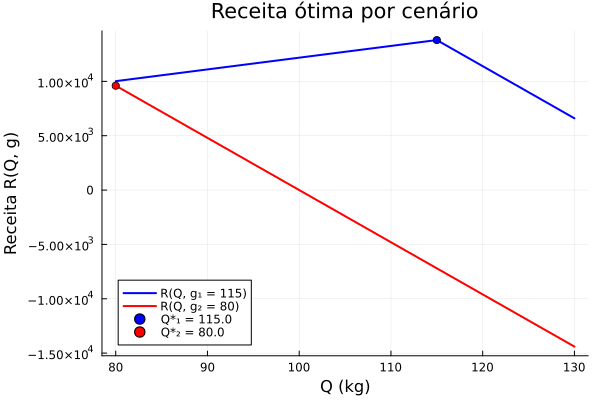

In [55]:

P = 120.0
π_C = 600.0
π_V = 12.0

g₁ = 115.0
g₂ = 80.0

function R(Q, g)
    return Q > g ? P * Q - π_C * (Q - g) : P * Q + π_V * (g - Q)
end

function encontrar_Q_otimo(g)
    opt = optimize(Q -> -R(Q, g), 80.0, 130.0)
    Q_star = Optim.minimizer(opt)
    R_star = R(Q_star, g)
    return Q_star, R_star
end

Q₁_opt, R₁_opt = encontrar_Q_otimo(g₁)
Q₂_opt, R₂_opt = encontrar_Q_otimo(g₂)

R₁(Q) = Q > g₁ ? P * Q - π_C * (Q - g₁) : P * Q + π_V * (g₁ - Q)
R₂(Q) = Q > g₂ ? P * Q - π_C * (Q - g₂) : P * Q + π_V * (g₂ - Q)

plot(R₁, 80, 130, label="R(Q, g₁ = 115)", lw=2, color=:blue)
plot!(R₂, 80, 130, label="R(Q, g₂ = 80)", lw=2, color=:red)
scatter!([Q₁_opt], [R₁_opt], label="Q*₁ = $(round(Q₁_opt, digits=2))", color=:blue, marker=:circle)
scatter!([Q₂_opt], [R₂_opt], label="Q*₂ = $(round(Q₂_opt, digits=2))", color=:red, marker=:circle)

xlabel!("Q (kg)")
ylabel!("Receita R(Q, g)")
title!("Receita ótima por cenário")


In [56]:
println("Receita ótima cenário ω₁ = $R₁_opt")
println("Receita ótima cenário ω₂ = $R₂_opt")

Receita ótima cenário ω₁ = 13799.999792759822
Receita ótima cenário ω₂ = 9599.999409032902


##c)

In [5]:
println(" Receita sob decisão ótima para ω₁ se ocorrer ω₂: R(115, 80) = \$", R(Q₁_opt, g₂))

 Receita sob decisão ótima para ω₁ se ocorrer ω₂: R(115, 80) = $-7199.999078932538


##d)

In [57]:
P = 120.0
π_C = 600.0
π_V = 12.0

g₁ = 115.0
g₂ = 80.0

p₁ = 0.81
p₂ = 0.19

function R(Q, g)
    Q > g ? P * Q - π_C * (Q - g) : P * Q + π_V * (g - Q)
end

function valor_esperado(Q)
    return p₁ * R(Q, g₁) + p₂ * R(Q, g₂)
end

opt = optimize(Q -> -valor_esperado(Q), 80.0, 130.0)
Q_opt = Optim.minimizer(opt)
R_exp = valor_esperado(Q_opt)

R_1 = R(Q_opt, g₁)
R_2 = R(Q_opt, g₂)

println("Q ótimo para valor esperado: ", round(Q_opt, digits=2))
println("Valor esperado da receita: \$", round(R_exp, digits=2))
println("Receita com g₁ = 115: \$", round(R_1, digits=2))
println("Receita com g₂ = 80 : \$", round(R_2, digits=2))


Q ótimo para valor esperado: 80.0
Valor esperado da receita: $9940.2
Receita com g₁ = 115: $10020.0
Receita com g₂ = 80 : $9600.0


##e)

In [58]:
p₁ = 0.82
p₂ = 0.18

opt = optimize(Q -> -valor_esperado(Q), 80.0, 130.0)
Q_opt = Optim.minimizer(opt)
R_exp = valor_esperado(Q_opt)

R_1 = R(Q_opt, g₁)
R_2 = R(Q_opt, g₂)

println("Q ótimo para valor esperado: ", round(Q_opt, digits=2))
println("Valor esperado da receita: \$", round(R_exp, digits=2))
println("Receita com g₁ = 115: \$", round(R_1, digits=2))
println("Receita com g₂ = 80 : \$", round(R_2, digits=2))

Q ótimo para valor esperado: 115.0
Valor esperado da receita: $10020.0
Receita com g₁ = 115: $13800.0
Receita com g₂ = 80 : $-7200.0


##f)

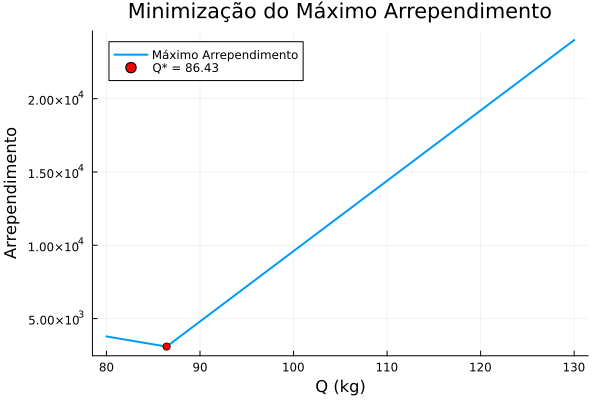

In [59]:
R_ideal_1 = R(g₁, g₁)
R_ideal_2 = R(g₂, g₂)

function max_arrependimento(Q)
    arrepend_1 = R_ideal_1 - R(Q, g₁)
    arrepend_2 = R_ideal_2 - R(Q, g₂)
    return max(arrepend_1, arrepend_2)
end

Qs = 80:0.1:130
arrependimentos = [max_arrependimento(Q) for Q in Qs]

opt = optimize(max_arrependimento, 80.0, 130.0)
Q_star = Optim.minimizer(opt)
R_star = max_arrependimento(Q_star)

plot(Qs, arrependimentos, label="Máximo Arrependimento", lw=2,
     xlabel="Q (kg)", ylabel="Arrependimento", title="Minimização do Máximo Arrependimento")
scatter!([Q_star], [R_star], label="Q* = $(round(Q_star, digits=2))", color=:red, marker=:circle)

##g)

In [60]:
R_g1 = R(Q_star, g₁)
R_g2 = R(Q_star, g₂)

println("Receitas com Q* = $(round(Q_star, digits=2)) que minimiza o arrependimento máximo:")
println("R(Q*, g₁ = 115) = \$", round(R_g1, digits=2))
println("R(Q*, g₂ = 80 ) = \$", round(R_g2, digits=2))

Receitas com Q* = 86.43 que minimiza o arrependimento máximo:
R(Q*, g₁ = 115) = $10714.29
R(Q*, g₂ = 80 ) = $6514.29


##h)

In [14]:
function valor_esperado_arrependimento(Q)
    arrepend_1 = R_ideal_1 - R(Q, g₁)
    arrepend_2 = R_ideal_2 - R(Q, g₂)
    return p₁ * arrepend_1 + p₂ * arrepend_2
end

opt_arrepend = optimize(valor_esperado_arrependimento, 80.0, 130.0)
opt_receita  = optimize(Q -> -valor_esperado(Q), 80.0, 130.0)

Q_arrep = Optim.minimizer(opt_arrepend)
Q_recei = Optim.minimizer(opt_receita)

println("Q* que minimiza E[Arrependimento] = ", round(Q_arrep, digits=2))
println("Q* que maximiza E[Receita]         = ", round(Q_recei, digits=2))

Q* que minimiza E[Arrependimento] = 115.0
Q* que maximiza E[Receita]         = 115.0


#Questão 21

#Questão 22

In [1]:
] add JuMP HiGHS Plots Distributions Statistics DecisionProgramming GraphViz GraphvizDotLang Ipopt

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
   Installed OpenBLAS32_jll ────── v0.3.24+0
   Installed HiGHS_jll ─────────── v1.10.0+0
   Installed Hwloc_jll ─────────── v2.12.0+0
   Installed MUMPS_seq_jll ─────── v500.700.301+0
   Installed Graphviz_jll ──────── v2.50.0+1
   Installed BenchmarkTools ────── v1.6.0
   Installed JSON3 ─────────────── v1.14.2
   Installed MathOptInterface ──── v1.38.0
   Installed METIS_jll ─────────── v5.1.3+0
   Installed SPRAL_jll ─────────── v2024.5.8+0
   Installed StructTypes ───────── v1.11.0
   Installed CodecBzip2 ────────── v0.8.5
   Installed Ipopt_jll ─────────── v300.1400.1700+0
   Installed JuMP ──────────────── v1.25.0
   Installed GraphViz ──────────── v0.2.0
   Installed MutableArithmetics ── v1.6.4
   Installed GraphvizDotLang ───── v0.2.1
   Installed ASL_jll ───────────── v0.1.3+0
   Installed Ipopt ─────────────── v1.8.0
   Installed HiGHS ─────────────── v1.15.0
   Installed DecisionPr

In [2]:
using JuMP, HiGHS, Plots, Distributions, Statistics, DecisionProgramming, GraphViz, GraphvizDotLang, Ipopt

##a)

In [22]:
I = [1000., 800.]
c = [8., 12.]
Q = [100, 110]
T_c = 2
T_u = 20
Ω     = ["ω_1","ω_2","ω_3"]
π_ω   = [20., 10., 5.]
p_ω   = [0.35, 0.3, 0.35]

n_cenarios = 3

r = 0.1

0.1

In [23]:
function InvestimentoInicial(I::Vector{Float64}, r::Float64, inv_indeces::Vector{Int64})::Float64
  if inv_indeces[1] == 0
    return 0.0
  end
  return -sum((sum(I[i] for i in inv_indeces))/((1 + r)^t) for t in 0:T_c-1)
end

function FluxoDeCaixa(c::Vector{Float64}, Q::Vector{Int64}, π_ω::Float64, r::Float64, inv_indeces::Vector{Int64})::Float64
  return sum(((π_ω*(sum(Q[i] for i in inv_indeces)))-(sum(Q[i]*c[i] for i in inv_indeces)))/((1 + r)^t) for t in T_c:T_c+T_u-1)
end

function  VPL(I::Vector{Float64}, c::Vector{Float64}, Q::Vector{Int64}, ω::String, π_ω::Float64, r::Float64, inv_indeces::Vector{Int64})::Float64
  if inv_indeces[1] == 0
    return 0.0
  end
  return -sum((sum(I[i] for i in inv_indeces))/((1 + r)^t) for t in 0:T_c-1) + sum((((sum(Q[i]*π_ω for i in inv_indeces)))-(sum(Q[i]*c[i] for i in inv_indeces)))/((1 + r)^t) for t in T_c:T_c+T_u-1)
end

function EVPL(n_cenarios::Int64, p_ω::Vector{Float64}, I::Vector{Float64}, c::Vector{Float64},
        Q::Vector{Int64}, ω::Vector{String}, π_ω::Vector{Float64}, r::Float64, inv_indeces::Vector{Int64})::Float64
  return sum(VPL(I, c, Q, ω[i], π_ω[i], r, inv_indeces)*p_ω[i] for i in 1:n_cenarios)
end

EVPL (generic function with 1 method)

In [26]:
decisoes   = [[1,2]]
decisions_names = ["A e B"]
n_decisoes = length(decisoes)
cenarios = Matrix{Tuple}(undef, n_decisoes, n_cenarios)
cenarios = [(Ω[i], "$(p_ω[i]*100)%", VPL(I, c, Q, Ω[i], π_ω[i], r, decisoes[j])) for j in 1:n_decisoes, i in 1:n_cenarios]

g = digraph("Q22DecisionTree", bgcolor="white", rankdir="LR") |>
    attr(:node; fontname="Helvetica", fontsize="11") |>
    attr(:edge; fontname="Helvetica", fontsize="10") |>



    node("Investir", label="Decisão de Investimento", shape="box", style="filled", fillcolor="green")

    for j in 1:n_decisoes
      g = g |>
        node(decisions_names[j], label=decisions_names[j], shape="circle", style="filled", fillcolor="darkred") |>
        edge("Investir", decisions_names[j], label="$(round(InvestimentoInicial(I, r, decisoes[j]),digits=2))")
      for i in 1:n_cenarios
        ω, prob, retorno = cenarios[j,i]
        g = g |>
          node("R_$(decisions_names[j])$ω", label="$(round(retorno, digits=2))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
          edge(decisions_names[j], "R_$(decisions_names[j])$ω", label="$prob ; $(round.(FluxoDeCaixa(c, Q, π_ω[i], r, decisoes[j]),digits=2))")
      end
    end
    g = g |>
      node("Não exploração", label="0", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white",width="0.9",height="0.6",fixedsize="true") |>
      edge("Investir", "Não exploração", label="Não explorar")

save(g, "arvore_q22_julia.dot")

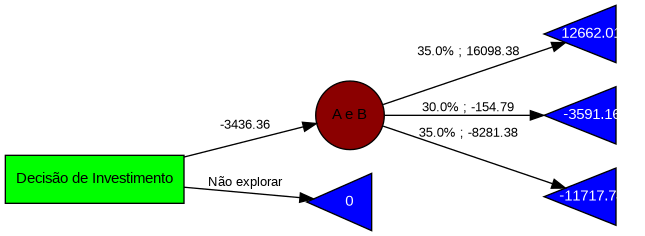

In [27]:
g

In [10]:
evpl = EVPL(n_cenarios, p_ω, I, c, Q, Ω, π_ω, r, [1,2])
if evpl > 0
  println("Vale a pena explorar as duas áreas simultaneamente pois EVPL = $evpl")
else
  println("Não vale a pena o investimento pois EVPL = $evpl.")
end

Não vale a pena o investimento pois EVPL = -746.8514612580911.


##b)

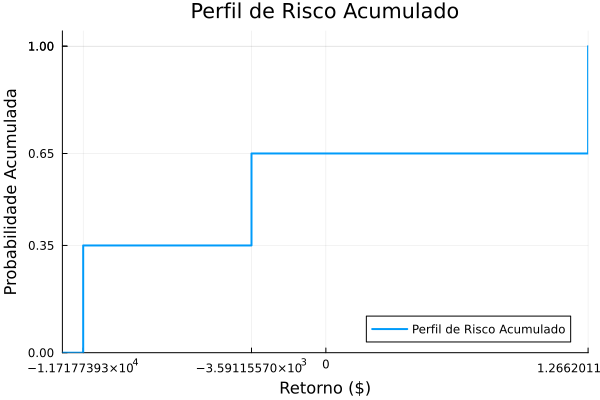

In [11]:
r_ω = [VPL(I, c, Q, Ω[i], π_ω[i], r, [1,2]) for i in 1:n_cenarios]
r_ω, p_ω = sort(r_ω), p_ω[sortperm(r_ω)]
cdf_novo = cumsum(p_ω)
ret_plot = [minimum(r_ω) - 1000; r_ω]
cdf_plot = [0.0; cdf_novo]

xticks_total = sort([unique(r_ω);0.0])
yticks_total = sort(unique([0.0; cdf_novo; 1.0]))

plt = plot(round.(ret_plot), cdf_plot,
     label="Perfil de Risco Acumulado", lw=2, line=:step, legend=:bottomright,
     xlabel="Retorno (\$)", ylabel="Probabilidade Acumulada",
     title="Perfil de Risco Acumulado", grid=true,
     xticks=xticks_total,
     yticks=yticks_total,
     xlims=(minimum(ret_plot)-5, maximum(r_ω)+5),
     ylims=(0, 1.05))
display(plt)

##c)

In [12]:
decisoes   = [[1],[2],[1,2]]
decisions_names = ["A", "B", "A e B"]
n_decisoes = length(decisoes)
cenarios = Matrix{Tuple}(undef, n_decisoes, n_cenarios)
cenarios = [(Ω[i], "$(p_ω[i]*100)%", VPL(I, c, Q, Ω[i], π_ω[i], r, decisoes[j])) for j in 1:n_decisoes, i in 1:n_cenarios]

g = digraph("Q22DecisionTree", bgcolor="white", rankdir="LR") |>
    attr(:node; fontname="Helvetica", fontsize="11") |>
    attr(:edge; fontname="Helvetica", fontsize="10") |>



    node("Investir", label="Decisão de Investimento", shape="box", style="filled", fillcolor="green")

    for j in 1:n_decisoes
      g = g |>
        node(decisions_names[j], label=decisions_names[j], shape="circle", style="filled", fillcolor="darkred") |>
        edge("Investir", decisions_names[j], label="$(round(InvestimentoInicial(I, r, decisoes[j]),digits=2))")
      for i in 1:n_cenarios
        ω, prob, retorno = cenarios[j,i]
        g = g |>
          node("R_$(decisions_names[j])$ω", label="$(round(retorno, digits=2))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
          edge(decisions_names[j], "R_$(decisions_names[j])$ω", label="$prob ; $(round.(FluxoDeCaixa(c, Q, π_ω[i], r, decisoes[j]),digits=2))")
      end
    end
    g = g |>
      node("Não exploração", label="0", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white",width="0.9",height="0.6",fixedsize="true") |>
      edge("Investir", "Não exploração", label="Não explorar")

save(g, "arvore2_q22_julia.dot")
save(g, "arvore2_q22_julia.png"; format="png")

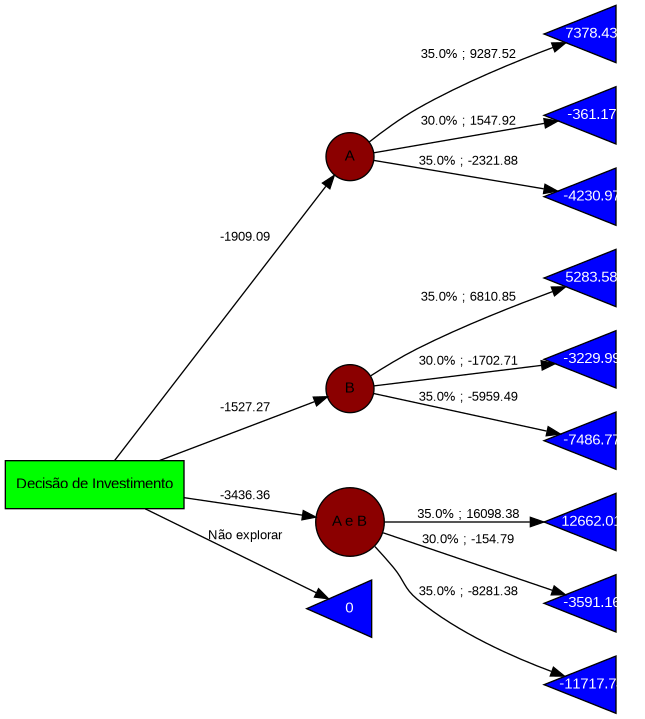

In [13]:
g

In [14]:
max_decisao = 0
max_evpl    = 0
for j in 1:n_decisoes
  current_evpl = EVPL(n_cenarios, p_ω, I, c, Q, Ω, π_ω, r, decisoes[j])
  if current_evpl > max_evpl
    max_decisao = j
    max_evpl    = current_evpl
  end
end
println("A melhor decisao é investir em $(decisions_names[max_decisao]) pois possui o maior EVPL = $(max_evpl)")

A melhor decisao é investir em A pois possui o maior EVPL = 993.2603590085992


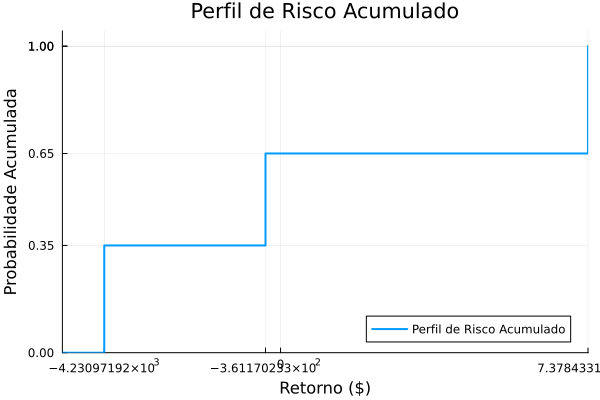

In [15]:
r_ω = [VPL(I, c, Q, Ω[i], π_ω[i], r, decisoes[max_decisao]) for i in 1:n_cenarios]
r_ω, p_ω = sort(r_ω), p_ω[sortperm(r_ω)]
cdf_novo = cumsum(p_ω)
ret_plot = [minimum(r_ω) - 1000; r_ω]
cdf_plot = [0.0; cdf_novo]

xticks_total = sort([unique(r_ω);0.0])
yticks_total = sort(unique([0.0; cdf_novo; 1.0]))

plt = plot(round.(ret_plot), cdf_plot,
     label="Perfil de Risco Acumulado", lw=2, line=:step, legend=:bottomright,
     xlabel="Retorno (\$)", ylabel="Probabilidade Acumulada",
     title="Perfil de Risco Acumulado", grid=true,
     xticks=xticks_total,
     yticks=yticks_total,
     xlims=(minimum(ret_plot)-5, maximum(r_ω)+5),
     ylims=(0, 1.05))
display(plt)

##d)

In [16]:
function PrimeiraDecisao(I::Vector{Float64}, r::Float64, decisao::Bool)::Float64
  if !decisao
    return 0.0
  end
  return -sum((I[1])/((1 + r)^t) for t in 0:T_c-1)
end

function SegundaDecisao(I::Vector{Float64}, r::Float64, decisao::Bool)::Float64
  if !decisao
    return 0.0
  end
  return -sum((I[2])/((1 + r)^t) for t in 2:T_c+2-1)
end

function FluxoDeCaixa(c::Vector{Float64}, Q::Vector{Int64}, π_ω::Float64, r::Float64, decisoes::Vector{Bool})::Float64
  fluxoA = 0.0
  fluxoB = 0.0
  if decisoes[1]
    fluxoA = sum(((π_ω*Q[1])-(Q[1]*c[1]))/((1 + r)^t) for t in T_c:T_c+T_u-1)
  elseif decisoes[2]
    fluxoB = sum(((π_ω*Q[2])-(Q[2]*c[2]))/((1 + r)^t) for t in T_c+2:T_c+T_u-1+2)
  end


  return fluxoA + fluxoB
end

function FluxoDeCaixaTotal(I::Vector{Float64}, c::Vector{Float64}, Q::Vector{Int64}, π_ω::Float64, r::Float64, decisoes::Vector{Bool})::Float64
  fluxoA = 0.0
  fluxoB = 0.0
  if decisoes[1]
    fluxoA = sum(((π_ω*Q[1])-(Q[1]*c[1]))/((1 + r)^t) for t in T_c:T_c+T_u-1) - sum((I[1])/((1 + r)^t) for t in 0:T_c-1)
  end
  if decisoes[2]
    fluxoB = sum(((π_ω*Q[2])-(Q[2]*c[2]))/((1 + r)^t) for t in T_c+2:T_c+T_u+2-1) - sum((I[2])/((1 + r)^t) for t in 2:T_c+2-1)
  end


  return fluxoA + fluxoB
end


FluxoDeCaixaTotal (generic function with 1 method)

In [17]:

cenarios = ["ω1", "ω2", "ω3"]
π = Dict("ω1" => 0.35, "ω2" => 0.30, "ω3" => 0.35)
precos = Dict("ω1" => 20.0, "ω2" => 10.0, "ω3" => 5.0)

I_A, I_B = 1000.0, 800.0
c_A, c_B = 8.0, 12.0
Q_A, Q_B = 100.0, 110.0
T_construcao = 2
T_vida = 20
r = 0.10

# ------------------------ Diagrama de Influência ------------------------ #
diagram = InfluenceDiagram()

add_node!(diagram, DecisionNode("InvestA", [], ["Sim", "Não"]))
add_node!(diagram, DecisionNode("InvestB", ["InvestA"], ["Sim", "Não"]))
add_node!(diagram, ChanceNode("Cenario", [], cenarios))
add_node!(diagram, ValueNode("Retorno", ["InvestA", "InvestB", "Cenario"]))

generate_arcs!(diagram)

# ------------------------ Probabilidades ------------------------ #
pmat = ProbabilityMatrix(diagram, "Cenario")
for ω in cenarios
    pmat[ω] = π[ω]
end
add_probabilities!(diagram, "Cenario", pmat)

# ------------------------ Utilidades ------------------------ #
umat = UtilityMatrix(diagram, "Retorno")

for invA in ["Sim", "Não"], invB in ["Sim", "Não"], ω in cenarios
    πω = precos[ω]

    # Fluxo A
    fluxoA = (invA == "Sim") ? sum(((πω - c[1]) * Q[1]) / (1 + r)^t for t in 2:(T_vida+1)) - sum(I[1] / (1 + r)^t for t in 0:1) : 0.0

    # Fluxo B
    fluxoB = (invB == "Sim") ? sum(((πω - c[2]) * Q[2]) / (1 + r)^t for t in 4:(T_vida+3)) - sum(I[2] / (1 + r)^t for t in 2:3) : 0.0

    umat[invA, invB, ω] = fluxoA + fluxoB
end

add_utilities!(diagram, "Retorno", umat)
generate_diagram!(diagram)

# ------------------------ Resolver o modelo ------------------------ #
model = Model(HiGHS.Optimizer)
z = DecisionVariables(model, diagram)
x_s = PathCompatibilityVariables(model, diagram, z)
@objective(model, Max, expected_value(model, diagram, x_s))
optimize!(model)

# ------------------------ Análise de resultado ------------------------ #
z_opt = DecisionStrategy(diagram, z)
S_probabilities = StateProbabilities(diagram, z_opt)
println("\n Estratégia ótima:")
print_decision_strategy(diagram, z_opt, S_probabilities)

U_dist = UtilityDistribution(diagram, z_opt)
print_utility_distribution(U_dist)
print_statistics(U_dist)

Running HiGHS 1.10.0 (git hash: fd8665394e): Copyright (c) 2025 HiGHS under MIT licence terms
MIP  has 10 rows; 18 cols; 48 nonzeros; 6 integer variables (6 binary)
Coefficient ranges:
  Matrix [3e-01, 3e+00]
  Cost   [1e+02, 4e+03]
  Bound  [1e+00, 1e+00]
  RHS    [1e+00, 1e+00]
Presolving model
7 rows, 15 cols, 42 nonzeros  0s
7 rows, 14 cols, 39 nonzeros  0s

Solving MIP model with:
   7 rows
   14 cols (3 binary, 0 integer, 0 implied int., 11 continuous)
   39 nonzeros

Src: B => Branching; C => Central rounding; F => Feasibility pump; H => Heuristic; L => Sub-MIP;
     P => Empty MIP; R => Randomized rounding; S => Solve LP; T => Evaluate node; U => Unbounded;
     z => Trivial zero; l => Trivial lower; u => Trivial upper; p => Trivial point; X => User solution

        Nodes      |    B&B Tree     |            Objective Bounds              |  Dynamic Constraints |       Work      
Src  Proc. InQueue |  Leaves   Expl. | BestBound       BestSol              Gap |   Cuts   InLp Conf

In [18]:
println("Valor Esperado do Valor Presente Líquido (EVPL):")
println("EVPL = \$", round(objective_value(model), digits=2))

Valor Esperado do Valor Presente Líquido (EVPL):
EVPL = $993.26


In [19]:
decisoes   = [[1],[2],[1,2]]
decisions_names = ["A", "B", "A e B"]
n_decisoes = length(decisoes)
cenarios = Matrix{Tuple}(undef, n_decisoes, n_cenarios)
cenarios = [(Ω[i], "$(p_ω[i]*100)%", VPL(I, c, Q, Ω[i], π_ω[i], r, decisoes[j])) for j in 1:n_decisoes, i in 1:n_cenarios]


g = digraph("Q22DecisionTree", bgcolor="white", rankdir="LR") |>
    attr(:node; fontname="Helvetica", fontsize="11") |>
    attr(:edge; fontname="Helvetica", fontsize="10") |>



    node("Investir em A", label="Investir em A", shape="box", style="filled", fillcolor="green") |>

    node("Investir em B1", label="Investir em B", shape="box", style="filled", fillcolor="green") |>
    node("Investir em B2", label="Investir em B", shape="box", style="filled", fillcolor="green") |>

    edge("Investir em A", "Investir em B1", label="$(round(PrimeiraDecisao(I, r, true),digits=2))") |>
    edge("Investir em A", "Investir em B2", label="$(round(PrimeiraDecisao(I, r, false),digits=2))") |>

    node("Incerteza AB", label="Incerteza AB", shape="circle", style="filled", fillcolor="darkred") |>
    node("Incerteza A", label="Incerteza A", shape="circle", style="filled", fillcolor="darkred") |>
    node("Incerteza B", label="Incerteza B", shape="circle", style="filled", fillcolor="darkred") |>
    node("Não exploração", label="0", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white",width="0.9",height="0.6",fixedsize="true") |>

    edge("Investir em B1", "Incerteza AB", label="$(round(SegundaDecisao(I, r, true),digits=2))") |>
    edge("Investir em B1", "Incerteza A", label="$(round(SegundaDecisao(I, r, false),digits=2))") |>
    edge("Investir em B2", "Incerteza B", label="$(round(SegundaDecisao(I, r, true),digits=2))") |>
    edge("Investir em B2", "Não exploração", label="$(round(SegundaDecisao(I, r, false),digits=2))") |>

    node("R_AB_ω1", label=" $(round(FluxoDeCaixa(c, Q, π_ω[1], r, [true,true]) + PrimeiraDecisao(I, r, true) + SegundaDecisao(I, r, true))) ", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("R_AB_ω2", label=" $(round(FluxoDeCaixa(c, Q, π_ω[2], r, [true,true]) + PrimeiraDecisao(I, r, true) + SegundaDecisao(I, r, true)))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("R_AB_ω3", label=" $(round(FluxoDeCaixa(c, Q, π_ω[3], r, [true,true]) + PrimeiraDecisao(I, r, true) + SegundaDecisao(I, r, true)))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("R_A_ω1", label=" $(round(FluxoDeCaixa(c, Q, π_ω[1], r, [true,false]) + PrimeiraDecisao(I, r, true) + SegundaDecisao(I, r, false)))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("R_A_ω2", label=" $(round(FluxoDeCaixa(c, Q, π_ω[2], r, [true,false]) + PrimeiraDecisao(I, r, true) + SegundaDecisao(I, r, false)))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("R_A_ω3", label=" $(round(FluxoDeCaixa(c, Q, π_ω[3], r, [true,false]) + PrimeiraDecisao(I, r, true) + SegundaDecisao(I, r, false)))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("R_B_ω1", label=" $(round(FluxoDeCaixa(c, Q, π_ω[1], r, [false,true]) + PrimeiraDecisao(I, r, false) + SegundaDecisao(I, r, true)))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("R_B_ω2", label=" $(round(FluxoDeCaixa(c, Q, π_ω[2], r, [false,true]) + PrimeiraDecisao(I, r, false) + SegundaDecisao(I, r, true)))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>
    node("R_B_ω3", label=" $(round(FluxoDeCaixa(c, Q, π_ω[3], r, [false,true]) + PrimeiraDecisao(I, r, false) + SegundaDecisao(I, r, true)))", shape="triangle", orientation="90", style="filled", fillcolor="blue", fontcolor="white" ,width="1.0",height="0.6",fixedsize="true") |>

    edge("Incerteza AB", "R_AB_ω1", label="$(p_ω[1]) ; $(round(FluxoDeCaixa(c, Q, π_ω[1], r, [true,true]),digits=2))") |>
    edge("Incerteza AB", "R_AB_ω2", label="$(p_ω[2]) ; $(round(FluxoDeCaixa(c, Q, π_ω[2], r, [true,true]),digits=2))") |>
    edge("Incerteza AB", "R_AB_ω3", label="$(p_ω[3]) ; $(round(FluxoDeCaixa(c, Q, π_ω[3], r, [true,true]),digits=2))") |>
    edge("Incerteza A", "R_A_ω1", label="$(p_ω[1]) ; $(round(FluxoDeCaixa(c, Q, π_ω[1], r, [true,false]),digits=2))") |>
    edge("Incerteza A", "R_A_ω2", label="$(p_ω[2]) ; $(round(FluxoDeCaixa(c, Q, π_ω[2], r, [true,false]),digits=2))") |>
    edge("Incerteza A", "R_A_ω3", label="$(p_ω[3]) ; $(round(FluxoDeCaixa(c, Q, π_ω[3], r, [true,false]),digits=2))") |>
    edge("Incerteza B", "R_B_ω1", label="$(p_ω[1]) ; $(round(FluxoDeCaixa(c, Q, π_ω[1], r, [false,true]),digits=2))") |>
    edge("Incerteza B", "R_B_ω2", label="$(p_ω[2]) ; $(round(FluxoDeCaixa(c, Q, π_ω[2], r, [false,true]),digits=2))") |>
    edge("Incerteza B", "R_B_ω3", label="$(p_ω[3]) ; $(round(FluxoDeCaixa(c, Q, π_ω[3], r, [false,true]),digits=2))")

save(g, "arvore3_q22_julia.dot")
save(g, "arvore3_q22_julia.png"; format="png")

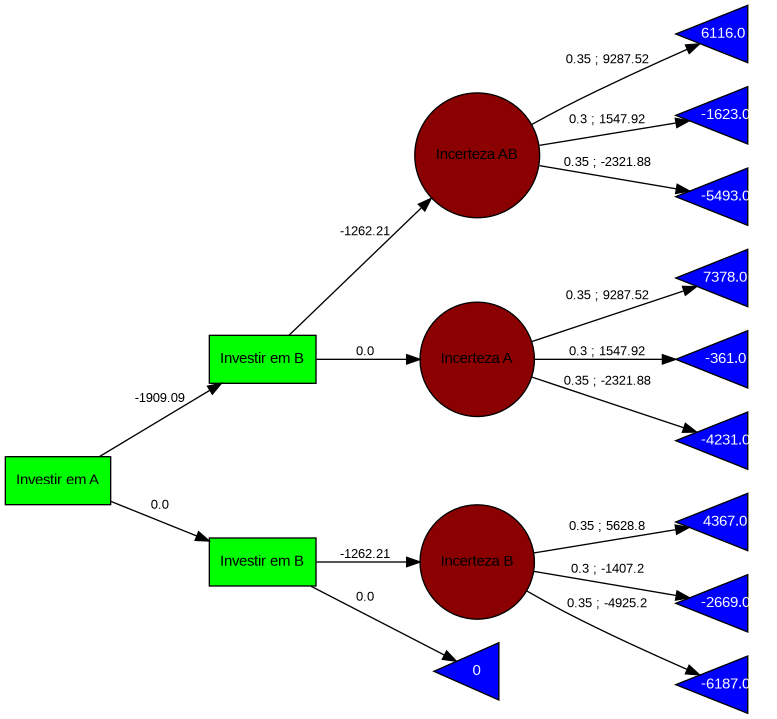

In [20]:
g

##e)

In [21]:
println("Valor da espera = $(round.((objective_value(model)-max_evpl), digits=2))")

Valor da espera = 0.0
